# **Code**

In [26]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.svm import SVR
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score
from matplotlib.colors import ListedColormap
import random
import joblib

In [2]:
# Load your dataset
train = pd.read_csv("Training.csv")
test = pd.read_csv("Testing.csv")

In [3]:
# Drop the 'Unnamed: 133', 'spotting_ urination', and 'fluid_overload.1' columns
columns_to_drop = ['Unnamed: 133', 'spotting_ urination', 'fluid_overload.1']
train = train.drop(columns=columns_to_drop)

columns_to_drop = ['spotting_ urination', 'fluid_overload.1']
test = test.drop(columns=columns_to_drop)

In [4]:
train.describe()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,pus_filled_pimples,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze
count,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,...,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000
mean,0.137805,0.159756,0.021951,0.045122,0.021951,0.162195,0.139024,0.045122,0.045122,0.021951,...,0.021951,0.021951,0.021951,0.023171,0.023171,0.023171,0.023171,0.023171,0.023171,0.023171
std,0.344730,0.366417,0.146539,0.207593,0.146539,0.368667,0.346007,0.207593,0.207593,0.146539,...,0.146539,0.146539,0.146539,0.150461,0.150461,0.150461,0.150461,0.150461,0.150461,0.150461
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
test.describe()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,pus_filled_pimples,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze
count,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,...,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000
mean,0.166667,0.190476,0.023810,0.047619,0.023810,0.166667,0.142857,0.047619,0.047619,0.023810,...,0.023810,0.023810,0.023810,0.047619,0.023810,0.023810,0.023810,0.023810,0.047619,0.023810
std,0.377195,0.397437,0.154303,0.215540,0.154303,0.377195,0.354169,0.215540,0.215540,0.154303,...,0.154303,0.154303,0.154303,0.215540,0.154303,0.154303,0.154303,0.154303,0.215540,0.154303
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [6]:
# Combine the training and testing data
data = pd.concat([train, test])
data.sample(10)


,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis
2279,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,Hepatitis D
462,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Peptic ulcer diseae
846,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,GERD
3900,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Peptic ulcer diseae
2749,0,0,0,0,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,GERD
392,0,0,0,0,0,0,1,0,0,0,...,0,0,1,1,1,1,0,0,0,Psoriasis
2586,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Chronic cholestasis
4211,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Heart attack
4218,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,(vertigo) Paroymsal Positional Vertigo
4655,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,Hepatitis D


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4962 entries, 0 to 41
Columns: 131 entries, itching to prognosis
dtypes: int64(130), object(1)
memory usage: 5.0+ MB


In [8]:
data.isnull().sum().sort_values(ascending=False)

itching                 0
red_spots_over_body     0
muscle_pain             0
irritability            0
depression              0
                       ..
abdominal_pain          0
constipation            0
back_pain               0
pain_behind_the_eyes    0
prognosis               0
Length: 131, dtype: int64

In [9]:
data.shape

(4962, 131)

In [10]:
data.columns

Index(['itching', 'skin_rash', 'nodal_skin_eruptions', 'continuous_sneezing',
       'shivering', 'chills', 'joint_pain', 'stomach_pain', 'acidity',
       'ulcers_on_tongue',
       ...
       'blackheads', 'scurring', 'skin_peeling', 'silver_like_dusting',
       'small_dents_in_nails', 'inflammatory_nails', 'blister',
       'red_sore_around_nose', 'yellow_crust_ooze', 'prognosis'],
      dtype='object', length=131)

In [11]:
#checking if there are any other data types
data.dtypes.unique()

array([dtype('int64'), dtype('O')], dtype=object)

In [12]:
#Checking how much percent each diseases having
data['prognosis'].value_counts(normalize = True)

Fungal infection                           0.024587
Hepatitis C                                0.024385
Hepatitis E                                0.024385
Alcoholic hepatitis                        0.024385
Tuberculosis                               0.024385
Common Cold                                0.024385
Pneumonia                                  0.024385
Dimorphic hemmorhoids(piles)               0.024385
Heart attack                               0.024385
Varicose veins                             0.024385
Hypothyroidism                             0.024385
Hyperthyroidism                            0.024385
Hypoglycemia                               0.024385
Osteoarthristis                            0.024385
Arthritis                                  0.024385
(vertigo) Paroymsal  Positional Vertigo    0.024385
Acne                                       0.024385
Urinary tract infection                    0.024385
Psoriasis                                  0.024385
Hepatitis D 

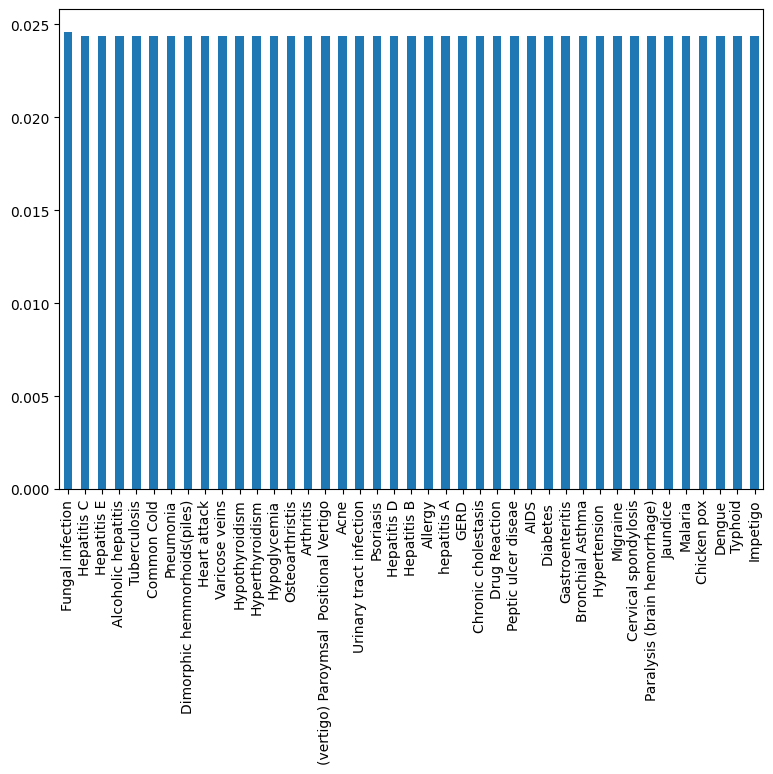

In [13]:
# Bar Chart
data['prognosis'].value_counts(normalize = True).plot.bar()
plt.subplots_adjust(left = 0.9, right = 2 , top = 2, bottom = 1)

In [14]:
#checking the relationship between the variables by applying the correlation
corr = data.corr()
mask = np.array(corr)
mask[np.tril_indices_from(mask)] = False
plt.subplots_adjust(left = 0.5, right = 16 , top = 20, bottom = 0.5)
sns.heatmap(corr, mask=mask,vmax=.9, square=True,annot=True, cmap="YlGnBu")

<ipython-input-14-4c3324b4d785>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = data.corr()


<Axes: >

In [15]:
#seperated the independent and dependent values to repective variables
x = data.drop(['prognosis'],axis =1)
y = data['prognosis']

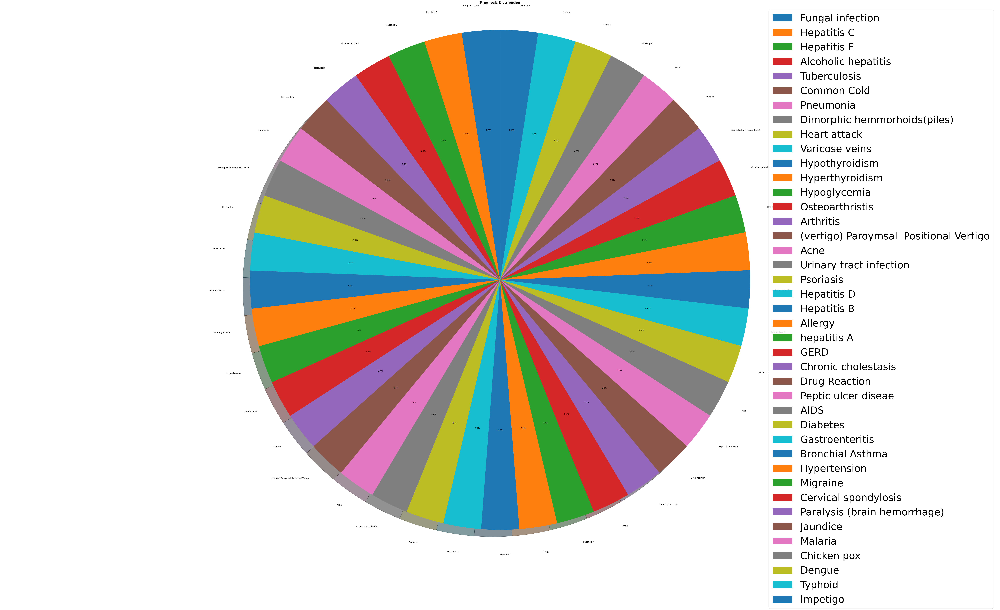

In [16]:

plt.figure(figsize=(90, 50))

category_counts = data['prognosis'].value_counts()


plt.pie(category_counts, labels=category_counts.index,  autopct='%1.1f%%', shadow=True, startangle=90)

plt.title('Prognosis Distribution', fontsize=16, fontweight='bold')
plt.legend(category_counts.index, loc='best', fontsize=50)
plt.axis('equal')

plt.show()

<ipython-input-17-5f9d724e3314>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = data.corr()


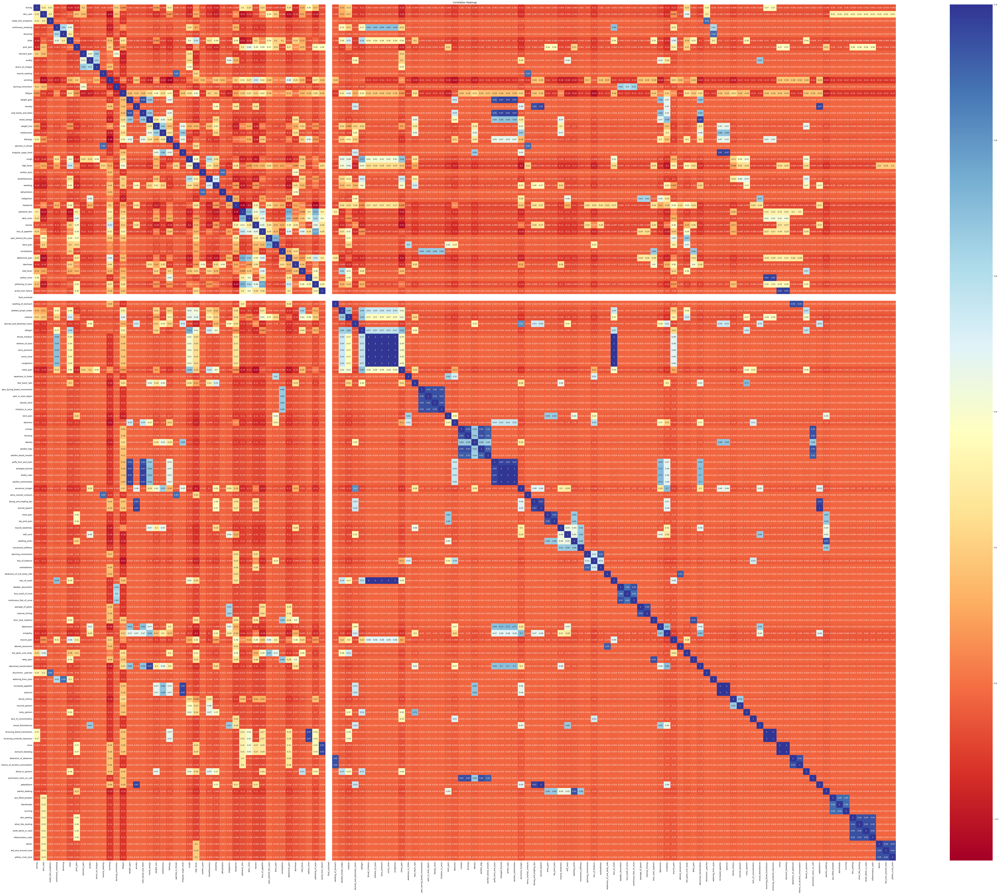

In [17]:
# Compute correlation matrix
corr_matrix = data.corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(100, 80))
sns.heatmap(corr_matrix, annot=True, cmap='RdYlBu')
plt.title('Correlation Heatmap')
plt.show()

In [18]:
#imported the chi square contingency
from scipy.stats import chi2_contingency

In [19]:
#as p value is  0.0  which is less than 0.05 then they are actually different from each other which satisfy the alternate hypothesis
chi2_contingency(pd.crosstab(data['cold_hands_and_feets'],data['weight_gain']))

Chi2ContingencyResult(statistic=4404.383098384241, pvalue=0.0, dof=1, expected_freq=array([[4.73466526e+03, 1.12334744e+02],
       [1.12334744e+02, 2.66525595e+00]]))

In [20]:
# Define the symptom-related columns
symptom_columns = [
    'itching', 'skin_rash', 'nodal_skin_eruptions', 'continuous_sneezing',
    'shivering', 'chills', 'joint_pain', 'stomach_pain', 'acidity',
    'ulcers_on_tongue', 'muscle_wasting', 'vomiting', 'burning_micturition',
    'spotting_urination', 'fatigue', 'weight_gain', 'anxiety',
    'cold_hands_and_feets', 'mood_swings', 'weight_loss', 'restlessness',
    'lethargy', 'patches_in_throat', 'irregular_sugar_level', 'cough',
    'high_fever', 'sunken_eyes', 'breathlessness', 'sweating', 'dehydration',
    'indigestion', 'headache', 'yellowish_skin', 'dark_urine', 'nausea',
    'loss_of_appetite', 'pain_behind_the_eyes', 'back_pain', 'constipation',
    'abdominal_pain', 'diarrhoea', 'mild_fever', 'yellow_urine',
    'yellowing_of_eyes', 'acute_liver_failure', 'fluid_overload',
    'swelling_of_stomach', 'swelled_lymph_nodes', 'malaise',
    'blurred_and_distorted_vision', 'phlegm', 'throat_irritation',
    'redness_of_eyes', 'sinus_pressure', 'runny_nose', 'congestion',
    'chest_pain', 'weakness_in_limbs', 'fast_heart_rate',
    'pain_during_bowel_movements', 'pain_in_anal_region', 'bloody_stool',
    'irritation_in_anus', 'neck_pain', 'dizziness', 'cramps', 'bruising',
    'obesity', 'swollen_legs', 'swollen_blood_vessels', 'puffy_face_and_eyes',
    'enlarged_thyroid', 'brittle_nails', 'swollen_extremeties',
    'excessive_hunger', 'extra_marital_contacts', 'drying_and_tingling_lips',
    'slurred_speech', 'knee_pain', 'hip_joint_pain', 'muscle_weakness',
    'stiff_neck', 'swelling_joints', 'movement_stiffness',
    'spinning_movements', 'loss_of_balance', 'unsteadiness',
    'weakness_of_one_body_side', 'loss_of_smell', 'bladder_discomfort',
    'foul_smell_of urine', 'continuous_feel_of_urine', 'passage_of_gases',
    'internal_itching', 'toxic_look_(typhos)', 'depression', 'irritability',
    'muscle_pain', 'altered_sensorium', 'red_spots_over_body', 'belly_pain',
    'abnormal_menstruation', 'dischromic _patches', 'watering_from_eyes',
    'increased_appetite', 'polyuria', 'family_history', 'mucoid_sputum',
    'rusty_sputum', 'lack_of_concentration', 'visual_disturbances',
    'receiving_blood_transfusion', 'receiving_unsterile_injections', 'coma',
    'stomach_bleeding', 'distention_of_abdomen', 'history_of_alcohol_consumption',
    'fluid_overload', 'blood_in_sputum', 'prominent_veins_on_calf', 'palpitations',
    'painful_walking', 'pus_filled_pimples', 'blackheads', 'scurring',
    'skin_peeling', 'silver_like_dusting', 'small_dents_in_nails',
    'inflammatory_nails', 'blister', 'red_sore_around_nose', 'yellow_crust_ooze'
]

# Drop 'prognosis' column to create X
X = data.drop(columns=['prognosis'])

# Create y as 'prognosis' column
y = data['prognosis']

# Define transformers for numeric and categorical features
numeric_features = X.select_dtypes(include=[np.number]).columns
categorical_features = X.select_dtypes(exclude=[np.number]).columns

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean'))
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(drop='first', sparse=False))
])

# Combine transformers using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Create a pipeline with preprocessing and Multinomial Naive Bayes classifier
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', MultinomialNB())
])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# Fit the model
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


In [21]:
# Perform cross-validation and print cross-validation scores
cv_scores = cross_val_score(model, X, y, cv=3)
print("Cross-Validation Scores:", cv_scores)
print("Mean Cross-Validation Score:", np.mean(cv_scores))

Cross-Validation Scores: [1.         1.         0.99939541]
Mean Cross-Validation Score: 0.9997984683595323


In [22]:
real_diseases = y_test.values

In [23]:
#for the cross checking purpose i want to see if predicted values and actual values are same else it gives me worng prediction
for i in range(0, len(real_diseases)):
    if y_pred[i] == real_diseases[i]:
        print ('Pred: {0} Actual:{1}'.format(y_pred[i], real_diseases[i]))
    else:
        print('worng prediction')
        print ('Pred: {0} Actual:{1}'.format(y_pred[i], real_diseases[i]))

Pred: Heart attack Actual:Heart attack
Pred: Psoriasis Actual:Psoriasis
Pred: Osteoarthristis Actual:Osteoarthristis
Pred: Common Cold Actual:Common Cold
Pred: Hyperthyroidism Actual:Hyperthyroidism
Pred: Chronic cholestasis Actual:Chronic cholestasis
Pred: Hepatitis D Actual:Hepatitis D
Pred: Hyperthyroidism Actual:Hyperthyroidism
Pred: Malaria Actual:Malaria
Pred: AIDS Actual:AIDS
Pred: Dengue Actual:Dengue
Pred: Acne Actual:Acne
Pred: Hypertension  Actual:Hypertension 
Pred: Urinary tract infection Actual:Urinary tract infection
Pred: Diabetes  Actual:Diabetes 
Pred: Typhoid Actual:Typhoid
Pred: Jaundice Actual:Jaundice
Pred: Hepatitis E Actual:Hepatitis E
Pred: Dengue Actual:Dengue
Pred: Hepatitis D Actual:Hepatitis D
Pred: Hypothyroidism Actual:Hypothyroidism
Pred: GERD Actual:GERD
Pred: Hepatitis C Actual:Hepatitis C
Pred: Gastroenteritis Actual:Gastroenteritis
Pred: Arthritis Actual:Arthritis
Pred: Heart attack Actual:Heart attack
Pred: Alcoholic hepatitis Actual:Alcoholic hepat

In [24]:
import random

# Function to predict using random user input
def predict_random_user_input(model, symptom_columns):
    print("Generating random input for the following symptoms:")
    symptoms = {}
    for i, symptom in enumerate(symptom_columns, start=1):
        symptom_value = random.randint(0, 1)
        symptoms[symptom] = symptom_value
        print(f"{i}. {symptom}: {symptom_value} (0 for no, 1 for yes)")

    # Create a DataFrame from the random input
    user_data = pd.DataFrame([symptoms])

    # Use the trained model to make predictions
    prediction = model.predict(user_data)
    print(f"The predicted prognosis is: {prediction[0]}")

# Call the predict_random_user_input function
predict_random_user_input(model, symptom_columns)


Generating random input for the following symptoms:
1. itching: 0 (0 for no, 1 for yes)
2. skin_rash: 0 (0 for no, 1 for yes)
3. nodal_skin_eruptions: 0 (0 for no, 1 for yes)
4. continuous_sneezing: 1 (0 for no, 1 for yes)
5. shivering: 0 (0 for no, 1 for yes)
6. chills: 0 (0 for no, 1 for yes)
7. joint_pain: 1 (0 for no, 1 for yes)
8. stomach_pain: 0 (0 for no, 1 for yes)
9. acidity: 0 (0 for no, 1 for yes)
10. ulcers_on_tongue: 0 (0 for no, 1 for yes)
11. muscle_wasting: 0 (0 for no, 1 for yes)
12. vomiting: 0 (0 for no, 1 for yes)
13. burning_micturition: 0 (0 for no, 1 for yes)
14. spotting_urination: 0 (0 for no, 1 for yes)
15. fatigue: 1 (0 for no, 1 for yes)
16. weight_gain: 1 (0 for no, 1 for yes)
17. anxiety: 0 (0 for no, 1 for yes)
18. cold_hands_and_feets: 1 (0 for no, 1 for yes)
19. mood_swings: 0 (0 for no, 1 for yes)
20. weight_loss: 0 (0 for no, 1 for yes)
21. restlessness: 0 (0 for no, 1 for yes)
22. lethargy: 1 (0 for no, 1 for yes)
23. patches_in_throat: 0 (0 for no, 

In [25]:
# Function to predict using user input
def predict_user_input(model, symptom_columns):
    print("Please provide input for the following symptoms:")
    symptoms = {}
    i = 1
    for symptom in symptom_columns:
        symptom_value = int(input(f"{i}. {symptom} (0 for no, 1 for yes): "))
        symptoms[symptom] = symptom_value
        i += 1

    # Create a DataFrame from the user input
    user_data = pd.DataFrame([symptoms])

    # Use the trained model to make predictions
    prediction = model.predict(user_data)
    print(f"The predicted prognosis is: {prediction[0]}")

# Ask the user if they want to execute the function
while True:
    user_choice = input("Do you want to execute the prediction function? (Yes/No): ").strip().lower()
    if user_choice == "yes":
        predict_user_input(model, symptom_columns)
    elif user_choice == "no":
        print("Okay, exiting the program.")
        break
    else:
        print("Invalid input. Please enter 'Yes' or 'No'.")


Do you want to execute the prediction function? (Yes/No): No
Okay, exiting the program.


In [27]:
# Save the trained model to a file
joblib.dump(model, 'disease_prediction_model.pkl')


['disease_prediction_model.pkl']